In [1]:
import qiskit
qiskit.__qiskit_version__

/Users/kpark/opt/anaconda3/lib/python3.7/site-packages/qiskit/aqua/__init__.py:86: DeprecationWarning: The package qiskit.aqua is deprecated. It was moved/refactored to qiskit-terra For more information see <https://github.com/Qiskit/qiskit-aqua/blob/main/README.md#migration-guide>
  warn_package('aqua', 'qiskit-terra')


{'qiskit-terra': '0.18.3', 'qiskit-aer': '0.9.0', 'qiskit-ignis': '0.6.0', 'qiskit-ibmq-provider': '0.12.3', 'qiskit-aqua': '0.9.5', 'qiskit': '0.30.1', 'qiskit-nature': None, 'qiskit-finance': None, 'qiskit-optimization': None, 'qiskit-machine-learning': None}

In [2]:
import numpy as np
# Importing standard Qiskit libraries
from qiskit import QuantumCircuit, transpile, Aer, IBMQ, execute
from qiskit.tools.jupyter import *
from qiskit.visualization import *
from ibm_quantum_widgets import *

In [3]:
# IBMQ.save_account('YOUR_TOKEN')
# IBMQ.stored_account()

In [4]:
provider = IBMQ.load_account()

In [5]:
provider_edu = IBMQ.get_provider(hub='ibm-q-education')

In [6]:
# ignore warning
import warnings
warnings.filterwarnings("ignore")

# 양자컴퓨터를 활용하여 양자역학 배워보기

안녕하세요! 이 노트북은 IBM Qiskit을 활용하여 양자역학을 배워보기 위한 자료입니다.

양자컴퓨터는 양자역학의 중첩과 얽힘을 활용하는 컴퓨터이며, 양자역학의 원리를 따르는 큐비트 (Quantum Bit)를 이용합니다. 즉, 반대로 말하면 양자컴퓨터는 실생활에서 보기 어려운 양자역학의 특성들을 확인하기에 좋은 실험장치이기도 합니다. 이 노트북에서는 먼저 양자상태와 측정을 배우고, 이후 양자얽힘을 직점 만들어보고 그 특성을 알아볼 것입니다.


양자역학의 유명한 사고 실험인 Stern-Gerlach 실험을 확인해봅니다. 또, Quantum Random Number Generator에 대해 알아보고, 양자얽힘을 직접 만들어보고 그 특성을 알아볼 것입니다!

## 목차

0. [개요](#intro)
1. [큐비트 상태](#qubit_state)    
    1-1. [양자상태의 시각화](#qubit_visualization)    
2. [양자회로와 측정](#circuit_n_measurement)    
    2-1. [실제 양자컴퓨터 하드웨어를 사용해봅시다!](#real_backend)    
3. [양자게이트](#quantum_gate)    
    3-1. [X게이트](#x-gate)    
    3-2. [H게이트](#h-gate)    
    3-3. [Z게이트](#z-gate)    
4. [양자얽힘 만들기 (GHZ 상태)](#entanglement)


## 0. 개요 <a id='intro'>
    
### 0.1 클라우드 양자컴퓨팅이란?
    
현 시점의 양자컴퓨터는 PC처럼 소형화되지 않았습니다. 다음은 현재 개발된 양자컴퓨터들의 사진입니다.
<div>
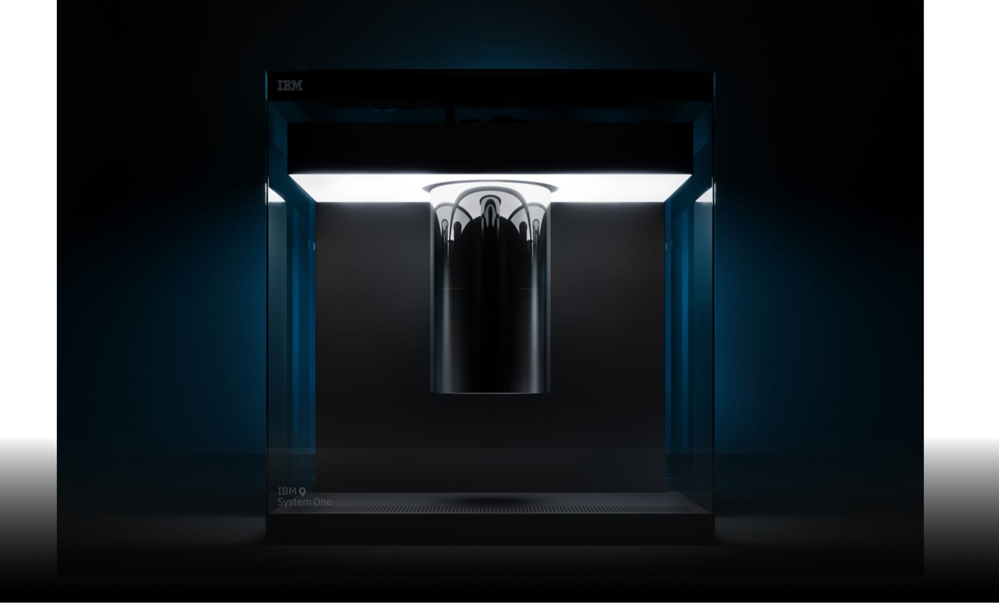
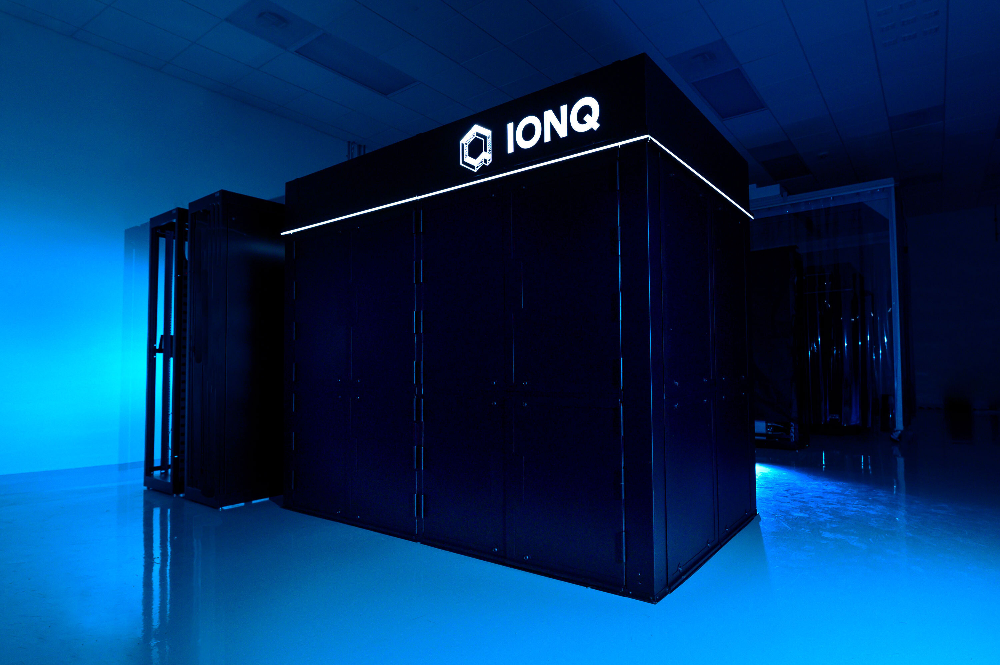
</div>
IBM, 구글, IonQ, Riggeti 등 양자컴퓨터 플랫폼 회사들은 양자컴퓨터 하드웨어를 파는 대신 하드웨어를 직접 관리하고 클라우드 서비스를 제공하는 형태로 사용자들에게 양자컴퓨터를 제공하고 있습니다. 사용자가 양자프로그램 또는 양자회로를 개인 PC에서 작성하여 제출하면 각 회사가 관리하는 양자컴퓨터에서 프로그램이 수행되고, 그 결과를 네트워크를 통해 받아보실 수 있습니다.

여기 클라우드 양자컴퓨터의 예시가 있습니다. IBM Q 양자컴퓨터도 거의 비슷한 프로세스로 작동합니다.

https://www.youtube.com/watch?v=wdIea5uGMW0

양자컴퓨터 실제 모습 예시

<div>
<img src="./img/ibmq.jpeg" width="800"/>
</div>

### 0.2 What is QISKIT?

* Quantum Information Science Kit

* Open-source SDK for working with quantum computers at the level of pulses, circuits and algorithms

* Founded by IBM Research in 2017 to allow software development for their cloud quantum computing service known as IBM Q Experience.

* The primary version of Qiskit uses the Python programming language. It is used to create quantum programs based on the OpenQASM (Open Quantum Assembly Language) representation of quantum instructions.

### 0.3 What can we do with Qiskit?

* Access to circuits
* Access to a library of quantum algorithms
* Access to quantum hardware
* Access to optimization against noise

## 1. 큐비트 (Qubit) 상태 <a id='qubit_state'>

양자컴퓨터의 핵심요소는 큐비트입니다. 두 개의 잘 정의된 양자상태를 가지고 있는 물리계는 모두 큐비트가 될 가능성이 있습니다. 0과 1을 두가지 상태를 가지는 비트(Bit)와 같이 큐비트가 가질 수 있는 두 개의 양자상태도 $|0\rangle$ 과 $|1\rangle$으로 표현합니다.

큐비트와 비트의 가장 중요한 차이는 양자역학적 중첩입니다. 비트는 0 또는 1, 딱 두 가지의 상태만 가질 수 있지만 큐비트는 양자역학적 중첩을 허용합니다. 임의의 큐비트 상태는 따라서 다음과 같이 쓸 수 있습니다.

$$ |\psi\rangle = \alpha |0\rangle + \beta |1\rangle, \textrm{where } |\alpha|^2 + |\beta|^2 = 1 $$

$\alpha$와 $\beta$는 임의의 복소수로, 단일 큐비트가 가질 수 있는 상태의 개수는 무한대로 존재합니다. 위의 양자상태를 줄여서 ($\alpha$, $\beta$)의 vector 형태로 나타낼 수 있습니다. 이 vector는 길이가 1인 2차원 vector입니다.

### 1-1.양자상태의 시각화 <a id = 'qubit_visualization'>
큐비트 양자상태를 시각화하는 방법은 여러가지가 있지만, 여기서는 QSphere를 활용해보려 합니다. 주어진 양자상태는 QSphere로 다음과 같이 그릴 수 있습니다.
Qsphere는 원의 크기와 색으로 양자상태를 표현합니다. 아래 두 qsphere plot은 $|0\rangle$ 상태와 $|1\rangle$ 상태를 표현한 것입니다.

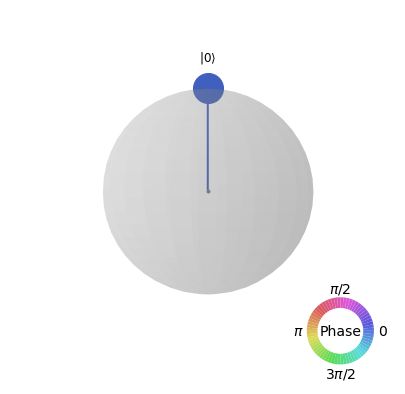

In [7]:
state = [1,0]   # |0> 상태를 준비해봅시다.
plot_state_qsphere(state) # qsphere를 그려봅니다.

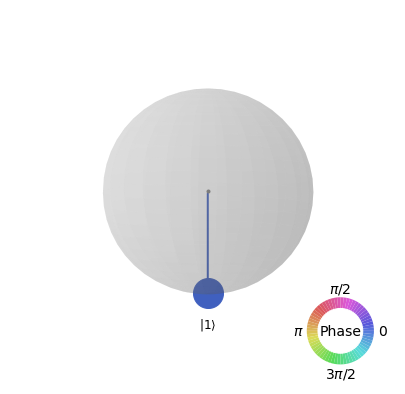

In [8]:
state = [0,1]   # |1> 상태입니다.
plot_state_qsphere(state)

위 두 상태는 측정에 대한 고유상태로, 측정시에 중첩에 의한 현상을 볼 수 없습니다. 양자역학적 중첩상태를 만들어봅시다!

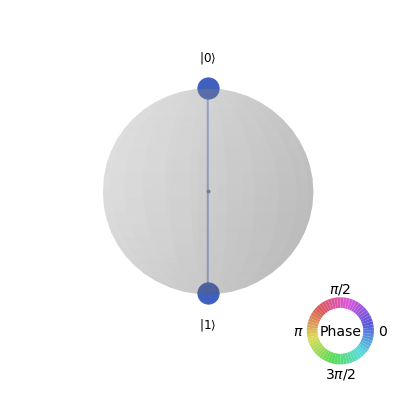

In [10]:
theta = np.pi * 1/2   # theta를 0 부터 pi 사이의 값으로 정해봅시다.
state = [np.cos(theta/2), np.sin(theta/2)]
plot_state_qsphere(state)

theta 값을 바꿨을때 위아래 원의 크기가 바뀌는 것을 볼 수 있습니다. 이는 큐비트의 상태가 양자역학적 중첩상태에 있음을 의미합니다. 원의 크기는 이 큐비트를 측정했을 때 0 또는 1이 나올 확률을 의미합니다. 원이 클 수록 해당 값이 나올 확률이 높은 것이죠.

<b>Q1-1. 두 원의 크기가 동일해지려면 theta 값이 어떻게 되어야 할까요? </b>

<b>Q1-2: 이것은 어떻게 확인해볼 수 있을까요?</b>


양자 상태에서는 확률 외에도 위상(phase)이 매우 중요합니다. 다음 예제를 통해서 양자 위상에 대해 알아봅시다.

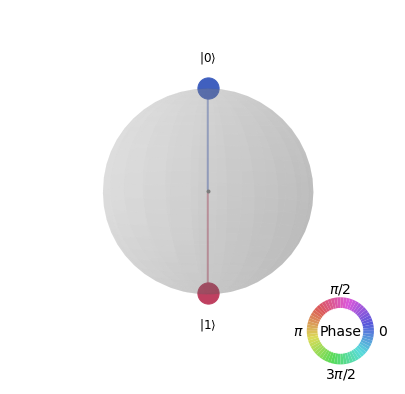

In [11]:
theta = np.pi * 1/2   # theta는 0.3pi로 정해둡니다.
phi = np.pi * 2/3     # phi 를 0에서 2pi까지 바꿔봅시다.
state = [np.cos(theta/2), np.sin(theta/2) * np.exp(1j*phi)]
plot_state_qsphere(state)

Qsphere에서 양자위상은 원의 색을 통해 나타납니다. 0과 1이 나올 확률이 같더라도 위상이 다르면 서로 다른 양자상태입니다.

여기서 중요한 부분은 위상을 이야기할때 항상 '상대적인' 위상이 중요하다는 점입니다. $|1\rangle$와 $e^{i\phi}|1\rangle$는 물리적으로 같은 상태이지만 $\frac{1}{\sqrt{2}}(|0\rangle + |1\rangle)$ 과 $\frac{1}{\sqrt{2}}(|0\rangle + e^{i\phi}|1\rangle)$는 다른 상태입니다.

위에서 살펴본것처럼 임의의 양자상태는 theta와 phi 두 값을 이용하여 전부 표현이 가능합니다. 이때 theta는 0과 1 두 양자상태의 확률에, phi는 0과 1 상태들의 상대적 위상과 관련이 있습니다.

## 2. 양자회로와 측정 <a id='circuit_n_measurement'>

일반적인 양자컴퓨터의 프로그램은 양자회로의 형태로 주어지게 됩니다. 양자회로는 1. 큐비트 초기화, 2. 양자게이트의 작용, 3. 양자상태 측정의 순서로 이루어 집니다. 이러한 양자회로 모델은 임의의 양자컴퓨터 알고리즘을 모두 기술할 수 있음이 잘 알려져 있습니다. 

이러한 양자컴퓨터 프로그램은 우리가 일반적으로 사용하는 프로그래밍 언어와는 다르게 보입니다. 이는 우리가 다루는 프로그래밍 언어는 CPU의 비트가 어떻게 연산되는지 고려하지 않아도 프로그램을 만들 수 있도록 하는 'High-level Pragramming languange'임에 반해, 아직 양자컴퓨터의 프로그램은 'Low-level Assembly Language'에 가깝기 때문입니다. 양자컴퓨터의 작동 원리는 일반적인 컴퓨터의 원리와 매우 다르기 때문에 기존의 컴퓨터에서 사용하던 어셈블리어를 사용하여 프로그램을 만들면 양자컴퓨터의 이점을 전혀 누릴 수 없습니다.

아래 예제를 통하여 간단한 양자회로를 만들어봅시다.

In [12]:
theta = np.pi * 0.3   # theta는 0.3pi로 정해둡니다.
phi = np.pi * 0.5     # phi 를 0에서 2pi까지 바꿔봅시다.
state = [np.cos(theta/2), np.sin(theta/2) * np.exp(1j*phi)]

# 단일 큐비트를 준비하는 양자회로를 만들어 봅시다.
qc = QuantumCircuit(1)    # qubit 1개의 양자회로를 만듭니다.
qc.initialize(state, 0)   # 0번 큐비트를 원하는 양자 상태로 준비합니다.
qc.draw()                 # 양자회로를 그려봅니다.

┌──────────────────────────────┐
q_0: ┤ Initialize(0.89101,0.45399j) ├
     └──────────────────────────────┘

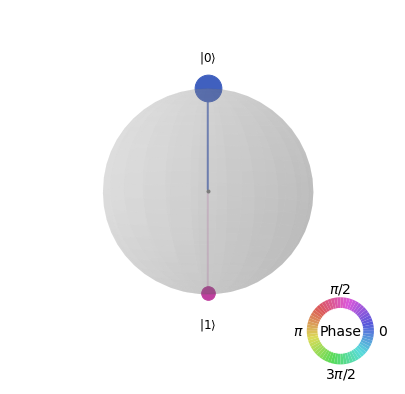

In [13]:
# 위 양자회로의 결과값을 qsphere로 다시 그려봅시다.
statevec_sim = Aer.get_backend('statevector_simulator')   # statevector 시뮬레이터를 불러옵니다.
vector = execute(qc, statevec_sim).result().get_statevector()   # 위에서 만든 양자회로의 결과상태를 얻습니다.
plot_state_qsphere(vector)

양자회로는 최종적으로 측정을 통해 연산결과를 얻습니다. 양자역학적인 측정은 양자상태를 붕괴시키고 그 측정결과와 붕괴된 상태는 측정 이전의 양자상태의 확률분포를 따르게 됩니다. QSphere에서 원의 크기와도 연관이 있겠죠.

좀더 구체적으로 양자상태를 측정했을때 0 또는 1의 결과가 나올 확률은 각각 $|\alpha|^2$ 과 $|\beta|^2$으로 주어집니다. 처음에 두 값의 합이 1이 되어야하는 조건이 왜 있는지 이제 이해가 되겠죠? 모든 가능한 경우의 확률의 합이 1이어야 하기 때문입니다.

양자회로에서 측정은 다음과 같이 적용됩니다.

In [14]:
# 위의 코드를 재사용합니다. 마지막 부분만 달라요.
theta = np.pi * 1/2   # theta는 0.3pi로 정해둡니다.
phi = np.pi * 2/3     # phi 를 0에서 2pi까지 바꿔봅시다.
state = [np.cos(theta/2), np.sin(theta/2) * np.exp(1j*phi)]

# 단일 큐비트를 준비하는 양자회로를 만들어 봅시다.
qc = QuantumCircuit(1)    # qubit 1개의 양자회로를 만듭니다.
qc.initialize(state, 0)   # 0번 큐비트를 원하는 양자 상태로 준비합니다.

qc.measure_all()          # 모든 큐비트를 측정합니다.

qc.draw()                 # 양자회로를 그려봅니다.

┌───────────────────────────────────────┐ ░ ┌─┐
   q_0: ┤ Initialize(0.70711,-0.35355+0.61237j) ├─░─┤M├
        └───────────────────────────────────────┘ ░ └╥┘
meas: 1/═════════════════════════════════════════════╩═
                                                     0

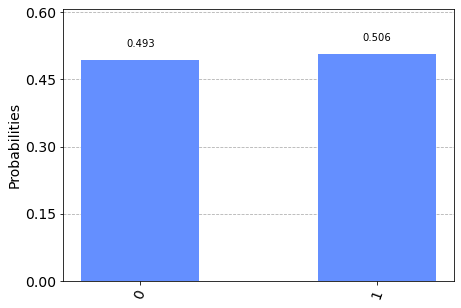

In [15]:
# 시뮬레이터를 이용하여 측정을 해봅시다.
qasm_sim = Aer.get_backend('qasm_simulator')  # qasm 시뮬레이터를 불러옵니다.
counts = execute(qc, qasm_sim, shots = 10000).result().get_counts()  # shots 횟수만큼 시뮬레이션을 수행하고 결과를 확인해봅시다.
plot_histogram(counts)

양자상태의 측정은 확률적인 과정으로 정확한 확률 분포를 얻기 위해서는 여러번 실험을 수행해야 합니다. 위의 시뮬레이션 결과를 여러 번 수행해보고 그 결과가 어떻게 바뀌는지 확인해보세요. 또, 아래 Qsphere와 비교해봅시다.

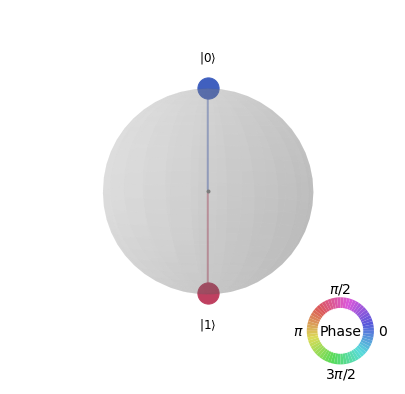

In [16]:
# qsphere와 비교해봅시다. 예상했던 결과와 비슷한가요?
plot_state_qsphere(state)

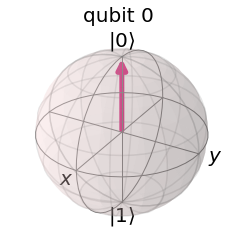

In [17]:
# 이번에는 Bloch sphere representation을 확인해봅시다
theta = np.pi * 0   # theta는 0.3pi로 정해둡니다.
phi = np.pi * 0    # phi 를 0에서 2pi까지 바꿔봅시다.
state = [np.cos(theta/2), np.sin(theta/2) * np.exp(1j*phi)]

plot_bloch_multivector(state)

<b> Q2-1. theta와 phi를 조절해서 0과 1이 나올 확률이 각각 25%, 75%인 양자상태를 만들어 봅시다! </b>

In [22]:
# Q2-1.
theta = np.pi * 2   # theta???
phi = np.pi * 0.5     # phi
state = [np.cos(theta/2), np.sin(theta/2) * np.exp(1j*phi)]

# 단일 큐비트를 준비하는 양자회로를 만들어 봅시다.
qc = QuantumCircuit(1)    # qubit 1개의 양자회로를 만듭니다.
qc.initialize(state, 0)   # 0번 큐비트를 원하는 양자 상태로 준비합니다.

qc.measure_all()          # 모든 큐비트를 측정합니다.

qc.draw()                 # 양자회로를 그려봅니다.

┌──────────────────┐ ░ ┌─┐
   q_0: ┤ Initialize(-1,0) ├─░─┤M├
        └──────────────────┘ ░ └╥┘
meas: 1/════════════════════════╩═
                                0

In [23]:
# 시뮬레이터를 이용하여 측정을 해봅시다.
qasm_sim = Aer.get_backend('qasm_simulator')  # qasm 시뮬레이터를 불러옵니다.
shots = 10000
counts = execute(qc, qasm_sim, shots = shots).result().get_counts()  # shots 횟수만큼 시뮬레이션을 수행하고 결과를 확인해봅시다.

if '0' in counts and abs(counts['0']/shots-0.25)<1e-2:
    print('Correct!')
else:
    print('Incorrect :(')

Incorrect :(


### 2-1. 실제 양자컴퓨터 하드웨어를 사용해봅시다! <a id = 'real_backend'>

여기까지 수행한 내용은 각자 PC의 시뮬레이터를 활용한 계산이었습니다. 양자컴퓨터를 모사하는 프로그램이죠. 실제 양자컴퓨터를 활용하려면 다음과 같은 코드를 사용하면 됩니다.

In [24]:
provider_edu = IBMQ.get_provider(hub='ibm-q-education')
# provider_skku = IBMQ.get_provider(hub='ibm-q-skku')

In [25]:
provider_edu.backends()

[<IBMQSimulator('ibmq_qasm_simulator') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_16_melbourne') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_armonk') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_santiago') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_bogota') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_casablanca') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_lima') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_belem') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>,
 <IBMQBackend('ibmq_q

전세계의 여러 유저들이 (그리고 오늘 강연에 참석한 여러분 모두가!) IBM 양자컴퓨터를 사용하기 때문에 결과를 바로 얻기는 어려울겁니다. 제출된 양자회로는 IBM 서버에서 순서대로 실행된 뒤, 계산이 완료되면 결과를 받아보실 수 있습니다.

In [26]:
devices = provider_edu.backends(filters=lambda x: x.configuration().n_qubits >= 2 
                                and x.configuration().n_qubits <14
                                and x.status().pending_jobs < 10)
print(devices)

[<IBMQBackend('ibmq_casablanca') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>, <IBMQBackend('ibmq_belem') from IBMQ(hub='ibm-q-education', group='sungkyunkwan-uni-1', project='skku-nano-qiskit')>]


In [27]:
from qiskit.tools.monitor import backend_monitor, job_monitor
from qiskit.tools.visualization import plot_error_map

In [28]:
backend_monitor(provider_edu.get_backend('ibmq_belem'))
#plot_error_map(provider_edu.get_backend('ibmq_bogota'))

ibmq_belem
Configuration
-------------
    n_qubits: 5
    operational: True
    status_msg: active
    pending_jobs: 4
    backend_version: 1.0.30
    basis_gates: ['id', 'rz', 'sx', 'x', 'cx', 'reset']
    local: False
    simulator: False
    hamiltonian: {'description': 'Qubits are modeled as Duffing oscillators. In this case, the system includes higher energy states, i.e. not just |0> and |1>. The Pauli operators are generalized via the following set of transformations:\n\n$(\\mathbb{I}-\\sigma_{i}^z)/2 \\rightarrow O_i \\equiv b^\\dagger_{i} b_{i}$,\n\n$\\sigma_{+} \\rightarrow b^\\dagger$,\n\n$\\sigma_{-} \\rightarrow b$,\n\n$\\sigma_{i}^X \\rightarrow b^\\dagger_{i} + b_{i}$.\n\nQubits are coupled through resonator buses. The provided Hamiltonian has been projected into the zero excitation subspace of the resonator buses leading to an effective qubit-qubit flip-flop interaction. The qubit resonance frequencies in the Hamiltonian are the cavity dressed frequencies and not exactl

In [29]:
# 실제 사용할 하드웨어를 지정해보겠습니다.
backend = provider_edu.get_backend('ibmq_belem')  # bogota라는 이름의 양자컴퓨터를 사용합니다.
job = execute(qc, backend, shots = 8192)  # 양자컴퓨터에 양자회로를 제출합니다.

In [30]:
# job이 완료가 되었는지 확인해봅시다.
job.status()

<JobStatus.QUEUED: 'job is queued'>

In [31]:
import time
# 연속적으로 job 상태를 체크합니다. (다른 cell의 실행을 막습니다.)
while not job.in_final_state():
    print('waiting...')
    time.sleep(10)  # 10초에 한번씩 체크합니다.
print(job.status())

waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
JobStatus.DONE


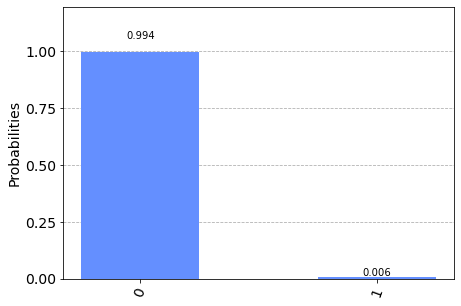

In [32]:
# job이 완료가 되었다면 다음과 같은 명령어로 결과를 확인할 수 있습니다.
result = job.result()
counts = result.get_counts()
plot_histogram(counts)

첫 양자컴퓨터 사용을 축하합니다! 어렵지 않죠?

## 3. 양자게이트 <a id = 'quantum_gate'></a>

양자프로그램의 핵심은 어떠한 양자게이트를 활용하여 원하는 양자상태를 만드는지에 있습니다. 실제 양자컴퓨터 하드웨어에서는 준비된 큐비트를 정해진 시작상태(일반적으로 $|00...0\rangle$)로 준비한 뒤 양자게이트를 이용해 원하는 양자상태를 만들어 나갑니다. 특정한 조합의 양자게이트를 양자컴퓨터 하드웨어에서 구현할 수 있으면 임의의 양자상태를 구현할 수 있다는 사실이 이미 알려져있습니다.
    
양자게이트는 하나의 큐비트에 작동하는 게이트와 여러 큐비트에 동시에 작동하는 게이트가 있습니다. 우선은 하나의 큐비트에 작동하는 게이트를 알아보도록 하죠.

양자상태가 무한대의 갯수로 있는 만큼 양자게이트도 무한대의 갯수로 존재합니다. 먼저 우리가 배울 단일 큐비트 게이트는 세 가지입니다. X 게이트, H 게이트, Z 게이트 세 양자게이트를 알아볼 것입니다.


### 3-1. X 게이트 <a id = 'x-gate'></a>
X 게이트는 $|0\rangle$을 $|1\rangle$ 상태로, $|1\rangle$을 $|0\rangle$로 바꾸는 게이트입니다. 임의의 양자상태에 대해서는 다음과 같이 작동합니다.

$$ |\psi\rangle = \alpha |0\rangle + \beta |1\rangle \rightarrow X|\psi\rangle = \alpha |1\rangle + \beta |0\rangle $$

일반적인 비트 연산에서 비트 플립 (bit flip)과 동일하게 작동하기 때문에 비트 플립 게이트라고도 불립니다.
    
아래 양자회로는 X게이트가 어떻게 작용하는지를 보여줍니다.

░ ┌───┐ ░ ┌───┐
q_0: ─░─┤ X ├─░─┤ X ├
      ░ └───┘ ░ └───┘

vector1 is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


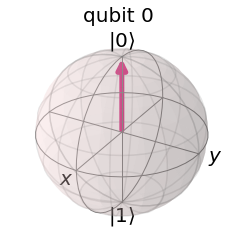

vector2 is  Statevector([0.+0.j, 1.+0.j],
            dims=(2,))


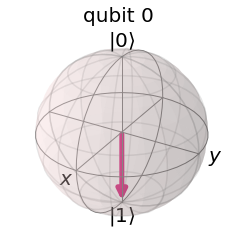

vector3 is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


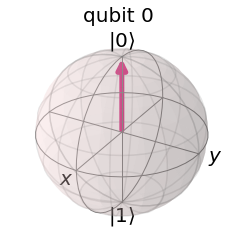

In [33]:
from qiskit.quantum_info import Statevector

# 처음 양자회로를 만들면 양자상태는 |0> 으로 준비됩니다.
qc = QuantumCircuit(1)
vector1 = Statevector.from_instruction(qc) # 양자회로의 결과를 vector로 얻어냅니다.


qc.barrier() # 양자회로에 구분선을 추가합니다.

qc.x(0) # |0> 상태를 |1> 상태로 바꿉니다.
vector2 = Statevector.from_instruction(qc)

qc.barrier()

qc.x(0)# |1> 상태를 |0> 상태로 바꿉니다.
vector3 = Statevector.from_instruction(qc)

display(qc.draw())

print('vector1 is ',vector1)
display(plot_bloch_multivector(vector1))
print('vector2 is ',vector2)
display(plot_bloch_multivector(vector2))
print('vector3 is ',vector3)
display(plot_bloch_multivector(vector3))

### 3-2. H 게이트 (하다마드, Hadamard) <a id='h-gate'></a>

이번에는 H 게이트를 알아봅시다. H 게이트를 이해하기 위해서는 특별한 양자상태를 정의할 필요가 있습니다. 아래 $|+\rangle$, $|-\rangle$ 상태의 정의를 봅시다.

$$ |\pm\rangle =  \frac{1}{\sqrt{2}}(|0\rangle \pm |1\rangle) $$

이 두 상태는 측정했을때 0 또는 1의 측정값이 나올 확률이 각각 50%이며, 서로 위상이 반대인 상태들입니다. 하다마드 게이트는 $|0\rangle$ 상태를 $|+\rangle$ 상태로, $|1\rangle$ 상태를 $|-\rangle$ 상태로 바꿔줍니다. 하다마드 게이트를 다시 한 번 가하면 원래의 양자상태로 돌아오는 성질이 있습니다.

░ ┌───┐ ░ ┌───┐
q_0: ─░─┤ H ├─░─┤ H ├
      ░ └───┘ ░ └───┘

vector1 is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


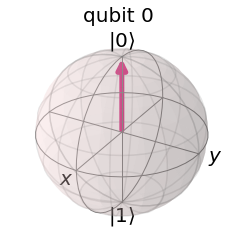

vector2 is  Statevector([0.70710678+0.j, 0.70710678+0.j],
            dims=(2,))


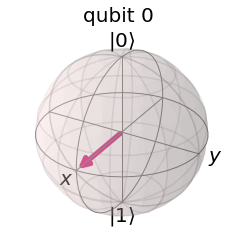

vector3 is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


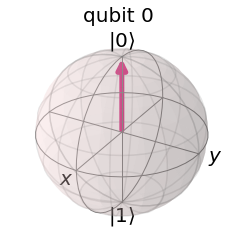

In [34]:
# 처음 양자회로를 만들면 양자상태는 |0> 으로 준비됩니다.
qc = QuantumCircuit(1)
vector1 = Statevector.from_instruction(qc) # 양자회로의 결과를 vector로 얻어냅니다.

qc.barrier() # 양자회로에 구분선을 추가합니다.

qc.h(0) # |0> 상태를 |+> 상태로 바꿉니다.
vector2 = Statevector.from_instruction(qc)

qc.barrier()

qc.h(0)# |+> 상태를 |0> 상태로 바꿉니다.
vector3 = Statevector.from_instruction(qc)

display(qc.draw())

print('vector1 is ',vector1)
display(plot_bloch_multivector(vector1))
print('vector2 is ',vector2)
display(plot_bloch_multivector(vector2))
print('vector3 is ',vector3)
display(plot_bloch_multivector(vector3))

┌───┐ ░ ┌───┐ ░ ┌───┐
q_0: ┤ X ├─░─┤ H ├─░─┤ H ├
     └───┘ ░ └───┘ ░ └───┘

vector1 is  Statevector([0.+0.j, 1.+0.j],
            dims=(2,))


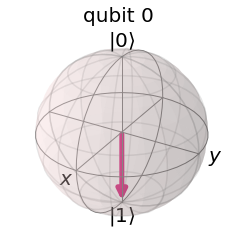

vector2 is  Statevector([ 0.70710678+0.j, -0.70710678+0.j],
            dims=(2,))


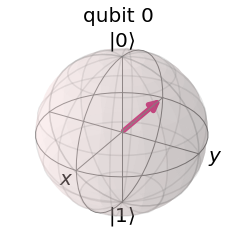

vector3 is  Statevector([0.+0.j, 1.+0.j],
            dims=(2,))


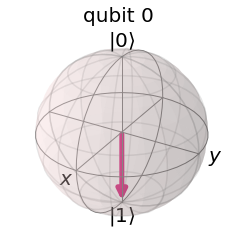

In [35]:
# 처음 양자회로를 만들면 양자상태는 |0> 으로 준비됩니다.
qc = QuantumCircuit(1)
qc.x(0)  # |0> 상태를 |1> 상태로 바꿉니다.
vector1 = Statevector.from_instruction(qc) # 양자회로의 결과를 vector로 얻어냅니다.

qc.barrier() # 양자회로에 구분선을 추가합니다.

qc.h(0) # |1> 상태를 |-> 상태로 바꿉니다.
vector2 = Statevector.from_instruction(qc)

qc.barrier()

qc.h(0)# |-> 상태를 |1> 상태로 바꿉니다.
vector3 = Statevector.from_instruction(qc)

display(qc.draw())

print('vector1 is ',vector1)
display(plot_bloch_multivector(vector1))
print('vector2 is ',vector2)
display(plot_bloch_multivector(vector2))
print('vector3 is ',vector3)
display(plot_bloch_multivector(vector3))

### 3-3. Z 게이트 <a id ='z-gate'></a>

마지막으로 Z 게이트를 알아봅시다. Z 게이트는 $|0\rangle$에는 변화를 주지 않고, $|1\rangle$ 상태에만 180도의 위상을 가해주는 양자게이트입니다. 즉, $|1\rangle$ 상태는 Z 게이트를 가하면 $-|1\rangle$ 상태가 됩니다. Z 게이트는 비트 플립과 비교해서 위상 플립 (phase flip) 게이트라고도 불립니다. 일반적인 작용은 다음과 같습니다.

$$ |\psi\rangle = \alpha |0\rangle + \beta |1\rangle \rightarrow Z|\psi\rangle = \alpha |0\rangle - \beta |1\rangle $$



<b> Q3-1. $|0\rangle$, $|1\rangle$, $|+\rangle$, $|-\rangle$ 상태에 각각 Z 게이트를 적용해봅시다. 그 결과가 어떤 상태인지 확인해봅시다.

prepared vector is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


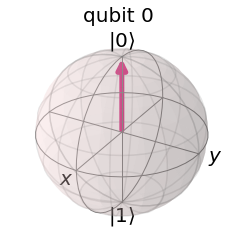

result_vector is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


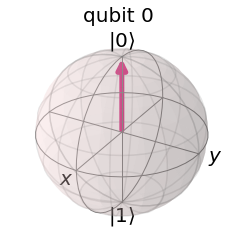

░ ┌───┐
q_0: ─░─┤ Z ├
      ░ └───┘

In [36]:
#Q3-1.
# 처음 양자회로를 만들면 양자상태는 |0> 으로 준비됩니다.
qc = QuantumCircuit(1)
"""
0, 1, +, - 상태를 만들어보세요.
"""

prep_vector = Statevector.from_instruction(qc)
print('prepared vector is ',prep_vector)
display(plot_bloch_multivector(prep_vector))

qc.barrier() # 양자회로에 구분선을 추가합니다.

qc.z(0) # 큐비트에 Z 게이트를 가해줍니다.
result_vector = Statevector.from_instruction(qc)
print('result_vector is ',result_vector)
display(plot_bloch_multivector(result_vector))

qc.draw()

<b> Q3-2. H, Z게이트만을 이용해서 $|1\rangle$ 상태를 만들어봅시다. </b>

In [37]:
# Q3-2
qc = QuantumCircuit(1)

"""
여기에 code를 작성해보세요. H, Z 게이트만 사용하세요!
"""

vector = Statevector.from_instruction(qc)
answer = [0j , 1 + 0j]
if all(vector.data == answer):
    print('Correct!')
else:
    print('Incorrect :(')

Incorrect :(


### 3.4 Bloch sphere 상에서의 회전 게이트

앞서 보았던 X, Z, H 게이트들은 Bloch sphere 상에서 unit vector(편의상 Bloch vector라고 하겠습니다)의 회전으로도 이해할 수 있었습니다. 그렇다면 이번에는 마지막으로 임의의 단일 큐빗 게이트가 Bloch sphere 상에서의 회전 게이트를 통해 구현될 수 있음을 살펴보겠습니다.

먼저 Bloch vector로 표현되는 임의의 양자상태는 Bloch sphere의 두개의 orthogonal 축에 대한 회전을 사용하면 만들어 낼 수 있습니다. 본 실습에서는 편의상 y축과 z축을 사용하도록 하겠습니다.

Bloch sphere의 y축과 z축에 대한 회전은 각각 다음과 같이 수학적으로 표현될 수 있습니다.

$R_y(\theta) = \begin{bmatrix} \cos(\theta/2) & -\sin(\theta/2)\\ \sin(\theta/2) & \cos(\theta/2)\end{bmatrix}$ (qiskit code: `qc.ry(theta,q)`)

$R_z(\theta) = \begin{bmatrix} \exp(-i\theta/2) & 0\\ 0 & \exp(i\theta/2)\end{bmatrix}$ (qiskit code: `qc.rz(theta,q)`)

다음 예시에서는 간단하게 Ry와 Rz 게이트에 대한 효과를 살펴보도록 하겠습니다.

┌──────────┐
q_0: ┤ Ry(2π/3) ├
     └──────────┘

vector1 is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


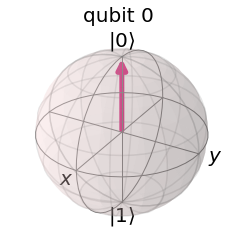

vector2 is  Statevector([0.5      +0.j, 0.8660254+0.j],
            dims=(2,))


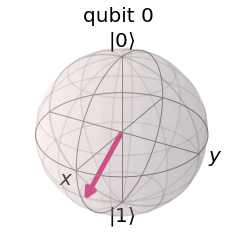

In [38]:
# 먼저 Ry 게이트만 살펴보겠습니다 (y축 회전)
# 처음 양자회로를 만들면 양자상태는 |0> 으로 준비됩니다.
qc = QuantumCircuit(1)

vector1 = Statevector.from_instruction(qc) # 양자회로의 초기상태를 vector로 얻어냅니다.

theta = np.pi * 2/3
qc.ry(theta,0)  # y축으로 theta만큼 회전을 시킵니다
vector2 = Statevector.from_instruction(qc) # 회전 이후의 초기상태를 vector로 얻어냅니다.


display(qc.draw())

print('vector1 is ',vector1)
display(plot_bloch_multivector(vector1))
print('vector2 is ',vector2)
display(plot_bloch_multivector(vector2))

┌─────────┐┌─────────┐
q_0: ┤ Ry(π/2) ├┤ Rz(π/4) ├
     └─────────┘└─────────┘

vector1 is  Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


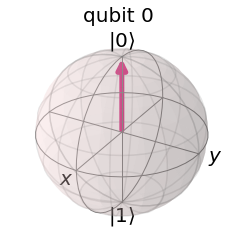

vector2 is  Statevector([0.70710678+0.j, 0.70710678+0.j],
            dims=(2,))


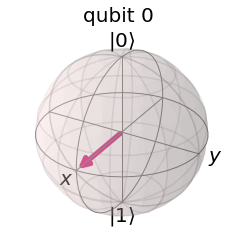

vector3 is  Statevector([0.65328148-0.27059805j, 0.65328148+0.27059805j],
            dims=(2,))


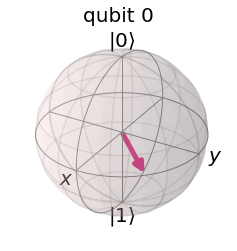

In [39]:
# 이번에는 Ry게이트 (y축 회전), 이후 Rz게이트 (z축 회전)에 따른 변화입니다.
# 처음 양자회로를 만들면 양자상태는 |0> 으로 준비됩니다.
qc = QuantumCircuit(1)

vector1 = Statevector.from_instruction(qc) # 양자회로의 초기상태를 vector로 얻어냅니다.

theta = np.pi * 0.5
qc.ry(theta,0)  # y축으로 theta만큼 회전을 시킵니다
vector2 = Statevector.from_instruction(qc) # 회전 이후의 초기상태를 vector로 얻어냅니다.

phi = np.pi * 0.25
qc.rz(phi,0)  # y축으로 theta만큼 회전을 시킵니다
vector3 = Statevector.from_instruction(qc) # 회전 이후의 초기상태를 vector로 얻어냅니다.

display(qc.draw())

print('vector1 is ',vector1)
display(plot_bloch_multivector(vector1))
print('vector2 is ',vector2)
display(plot_bloch_multivector(vector2))
print('vector3 is ',vector3)
display(plot_bloch_multivector(vector3))

## 4. 양자얽힘 만들기 (GHZ 상태) <a id = 'entanglement'></a>

지금까지 하나의 큐비트로 여러가지 기초적인 공부를 해보았습니다. 마지막으로 여러개의 큐비트를 가지고 양자얽힘을 만들어봅시다!

양자얽힘은 두 개 이상의 큐비트가 따로 기술되지 못하는 높은 연관성을 갖는 것을 말합니다. 여기서는 Bell state (a.k.a  EPR pair)를 직접 만들어보고 그 특징을 간단히 살펴보려고 합니다.

Bell state에는 4가지 종류가 있는데, 여기서는 그 중에 한가지만 살펴보도록 하겠습니다. 이 Bell state는 각각 큐비트를 측정했을때 0 또는 1의 값을 얻을 확률이 반반이지만, 모든 큐비트의 측정값은 동일한 상태입니다. 수학적으로는 다음과 같이 기술됩니다.

$$ |\Phi\rangle = \frac{1}{\sqrt{2}}\left(|00\rangle + |11\rangle\right) $$

이러한 양자상태는 각각의 큐비트를 들여다보면 무작위성을 가지는 것처럼 보이지만, 전체 큐비트들의 상관관계를 살펴보면 강한 상관관계를 나타냄을 알 수 있습니다. 이러한 상관관계는 얽힘이라고도 부르며 양자상태가 가질수 있는 고유의 성질입니다.

Bell state와 같은 얽힘 상태는 단일 큐비트 게이트만으로는 만들 수 없고, 2개 이상의 큐비트 간에 상호작용을 일으키는 얽힘 게이트가 필요합니다. 2큐비트 얽힘 게이트의 한  예시로는 Controlled-NOT  (C-NOT) 게이트가 있으며, 여기서는 C-NOT 게이트를 사용해서 Bell state $|\Phi\rangle$ 를 만들어보겠습니다.

### C-NOT 게이트

Bell state를 만들어주는 양자회로를 돌려보기에 앞서 C-NOT게이트를 좀더 자세히 알아봅시다. C-NOT 게이트는 두개의  큐비트에 적용되며, 이 두개의 큐비트는 control 큐비트와 target 큐비트로 나누어집니다. C-NOT 게이트는 control 큐비트의 상태가 0일 경우, target 큐비트에 아무런 영향을 주지 않고, control 큐비트의 상태가 1일 경우, target 큐비트에 bit-flip 연산(X 게이트)를 가해줍니다.

C-NOT gate에 대한 truth table(진리표)를 채워봅시다

| control qubit (in) | target qubit (in) | control qubit (out) | target qubit (in)|
|---|---|---|---|
| 0 | 0 | 0 |  |
| 0 | 1 | 0 |  |
| 1 | 0 | 1 |  |
| 1 | 1 | 1 |  |

In [40]:
# Bell 상태를 만드는 양자회로를 돌려주는 함수입니다.
qc = QuantumCircuit(2)
qc.h(0)
qc.cx(0,1) # Controlled-NOT 또는 Controlled-X 게이트
qc.measure_all()
qc.draw()

┌───┐      ░ ┌─┐   
   q_0: ┤ H ├──■───░─┤M├───
        └───┘┌─┴─┐ ░ └╥┘┌─┐
   q_1: ─────┤ X ├─░──╫─┤M├
             └───┘ ░  ║ └╥┘
meas: 2/══════════════╩══╩═
                      0  1

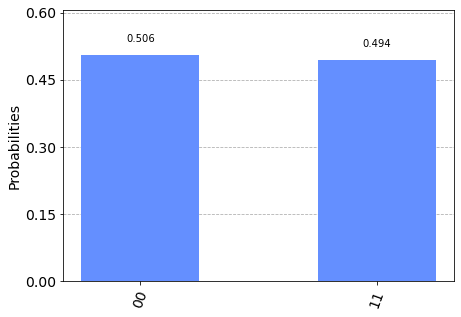

In [41]:
counts = execute(qc,qasm_sim).result().get_counts()
plot_histogram(counts)

00과 11이 대략 반반의 확률로 나왔습니다! 어느쪽 결과든지 두개 큐비트의 측정 결과가 전부 동일함을 알 수 있습니다.

이번 강의에서 다루지는 않지만 Bell state는 양자통신에 있어 매우 중요한 역할을 합니다. 또한 양자 텔레포테이션, Superdense coding 등 양자얽힘을 활용한 다양한 실험들이 알려져있으니 관심이 있다면 공부해보세요!

마지막으로 위에서 만든 entangled state를 만드는 양자회로를 실제 양자 하드웨어에서 실행해봅시다.

In [43]:
# 실제 사용할 하드웨어를 지정해보겠습니다.
backend = provider_edu.get_backend('ibmq_belem')  # bogota라는 이름의 양자컴퓨터를 사용합니다.
job = execute(qc, backend, shots = 8192)  # 양자컴퓨터에 양자회로를 제출합니다.

In [44]:
# job이 완료가 되었는지 확인해봅시다.
job.status()

<JobStatus.QUEUED: 'job is queued'>

In [45]:
import time
# 연속적으로 job 상태를 체크합니다. (다른 cell의 실행을 막습니다.)
while not job.in_final_state():
    print('waiting...')
    time.sleep(10)  # 10초에 한번씩 체크합니다.
print(job.status())

waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
waiting...
JobStatus.DONE


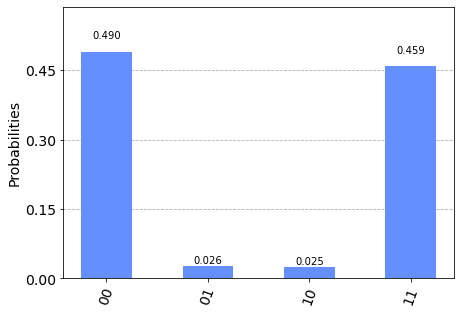

In [46]:
# job이 완료가 되었다면 다음과 같은 명령어로 결과를 확인할 수 있습니다.
result = job.result()
counts = result.get_counts()
plot_histogram(counts)